In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler


# Cargar el archivo NPY
intervals = np.load('C:/Users/TSE LATAM/Documents/Navarra/TFM/datasets/medidas_2d/1601/intervals_1601.npy')
intervals_ref = np.load('C:/Users/TSE LATAM/Documents/Navarra/TFM/datasets/medidas_2d/1601/intervals_ref_1601.npy')
labels_1601 = np.load('C:/Users/TSE LATAM/Documents/Navarra/TFM/datasets/medidas_2d/1601/labels_1601.npy')
labels_1601_ref = np.load('C:/Users/TSE LATAM/Documents/Navarra/TFM/datasets/medidas_2d/1601/labels_ref_1601.npy')
test_intervals_1601 = np.load('C:/Users/TSE LATAM/Documents/Navarra/TFM/datasets/medidas_2d/1601/test_intervals_1601.npy')
test_labels_1601 = np.load('C:/Users/TSE LATAM/Documents/Navarra/TFM/datasets/medidas_2d/1601/test_labels_1601.npy')
x_out_1601 = np.load('C:/Users/TSE LATAM/Documents/Navarra/TFM/datasets/medidas_2d/1601/X_out_1601.npy')
x_out_1601_ref = np.load('C:/Users/TSE LATAM/Documents/Navarra/TFM/datasets/medidas_2d/1601/X_out_ref_1601.npy')
x_out_1601_test = np.load('C:/Users/TSE LATAM/Documents/Navarra/TFM/datasets/medidas_2d/1601/X_out_test_1601.npy')

print('intervals:', intervals.shape)
print('intervals_ref:', intervals_ref.shape)
print('labels_1601:', labels_1601.shape)
print('labels_1601_ref:', labels_1601_ref.shape)
print('test_intervals_1601:', test_intervals_1601.shape)
print('test_labels_1601:', test_labels_1601.shape)
print('x_out_1601:', x_out_1601.shape)
print('x_out_1601_ref:', x_out_1601_ref.shape)
print('x_out_1601_test:', x_out_1601_test.shape)


C:\Users\TSE LATAM\AppData\Local\Temp\ipykernel_20028\1249299595.py:1: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


intervals: (4800,)
intervals_ref: (80,)
labels_1601: (4800,)
labels_1601_ref: (80,)
test_intervals_1601: (2400,)
test_labels_1601: (2400,)
x_out_1601: (4800, 1601, 128, 1)
x_out_1601_ref: (80, 1601, 128, 1)
x_out_1601_test: (2400, 1601, 128, 1)


In [2]:
# Normalizar los datos de entrenamiento y prueba
x_out_1601 = x_out_1601.astype('float32') / 255.0
x_out_1601_test = x_out_1601_test.astype('float32') / 255.0
x_out_1601_ref= x_out_1601_ref.astype('float32') / 255.0

In [3]:
def filter_cwt(X, thr):
    X_copy = X.copy()
    X_copy[X_copy < thr] = 0
    return X_copy

In [4]:
# thr = 0.1
# x_out_1601 = filter_cwt(x_out_1601, thr)
# x_out_1601_test= filter_cwt(x_out_1601_test, thr)
# x_out_1601_ref= filter_cwt(x_out_1601_ref, thr)

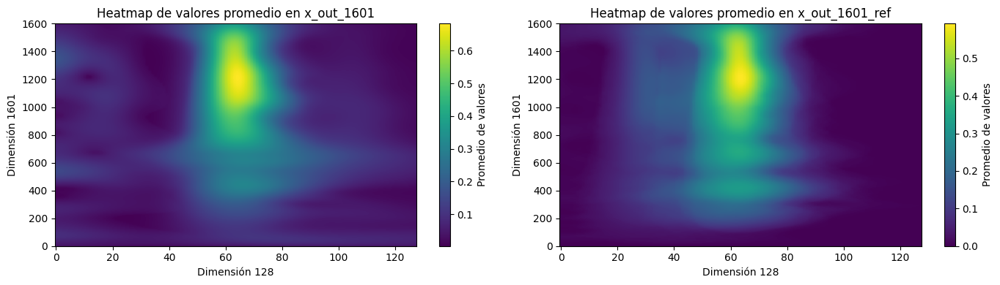

In [5]:
import numpy as np
import matplotlib.pyplot as plt

# Paso 1: Promediar sobre la primera dimensión para reducir la forma a (1601, 128, 1)
average_values_1 = x_out_1601.mean(axis=0)
average_values_2 = x_out_1601_ref.mean(axis=0)

# Paso 2: Eliminar la última dimensión, reduciendo la forma a (1601, 128)
average_values_squeezed_1 = np.squeeze(average_values_1)
average_values_squeezed_2 = np.squeeze(average_values_2)

# Crear una figura con dos subplots
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(14, 4))

# Paso 3: Crear el primer heatmap
im1 = axes[0].imshow(average_values_squeezed_1, aspect='auto', origin='lower', cmap='viridis')
axes[0].set_title('Heatmap de valores promedio en x_out_1601')
axes[0].set_xlabel('Dimensión 128')
axes[0].set_ylabel('Dimensión 1601')
fig.colorbar(im1, ax=axes[0], label='Promedio de valores')

# Paso 3: Crear el segundo heatmap
im2 = axes[1].imshow(average_values_squeezed_2, aspect='auto', origin='lower', cmap='viridis')
axes[1].set_title('Heatmap de valores promedio en x_out_1601_ref')
axes[1].set_xlabel('Dimensión 128')
axes[1].set_ylabel('Dimensión 1601')
fig.colorbar(im2, ax=axes[1], label='Promedio de valores')

# Ajustar el layout de la figura para que los subplots no se superpongan
plt.tight_layout()
plt.show()


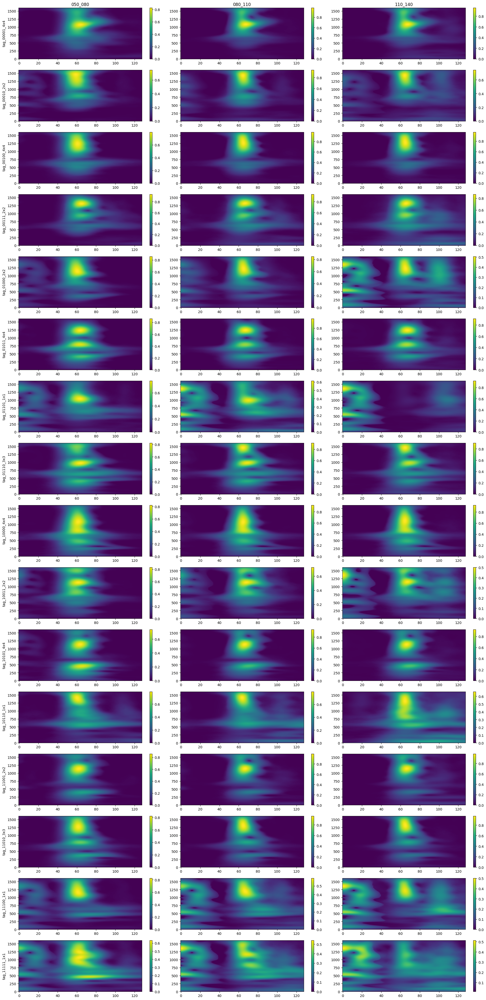

In [6]:
# Definir los intervalos y las etiquetas para el encabezado y las filas
interval_labels = ["050_080", "080_110", "110_140"]
unique_labels = np.unique(labels_1601)

# Crear un diccionario para almacenar los heatmaps
heatmaps = {}

# Paso 2: Promediar los valores de las imágenes hiperespectrales según las etiquetas y los intervalos
for label in unique_labels:
    heatmaps[label] = []
    for interval_label in interval_labels:
        interval_indices = (intervals == interval_label)
        label_indices = (labels_1601 == label)
        selected_indices = np.where(interval_indices & label_indices)[0]
        if len(selected_indices) > 0:
            average_values = x_out_1601[selected_indices].mean(axis=0)
            average_values_squeezed = np.squeeze(average_values)
            heatmaps[label].append(average_values_squeezed)
        else:
            heatmaps[label].append(np.zeros((1601, 128)))  # Agrega una matriz vacía si no hay coincidencias

# Paso 3: Crear una figura con subplots para visualizar los heatmaps
fig, axes = plt.subplots(nrows=len(unique_labels), ncols=len(interval_labels), figsize=(20, 40))

for i, label in enumerate(unique_labels):
    for j, interval_label in enumerate(interval_labels):
        ax = axes[i, j]
        im = ax.imshow(heatmaps[label][j], aspect='auto', origin='lower', cmap='viridis')
        if i == 0:
            ax.set_title(interval_label)
        if j == 0:
            ax.set_ylabel(label)
        fig.colorbar(im, ax=ax, orientation='vertical')

plt.tight_layout()
plt.show()


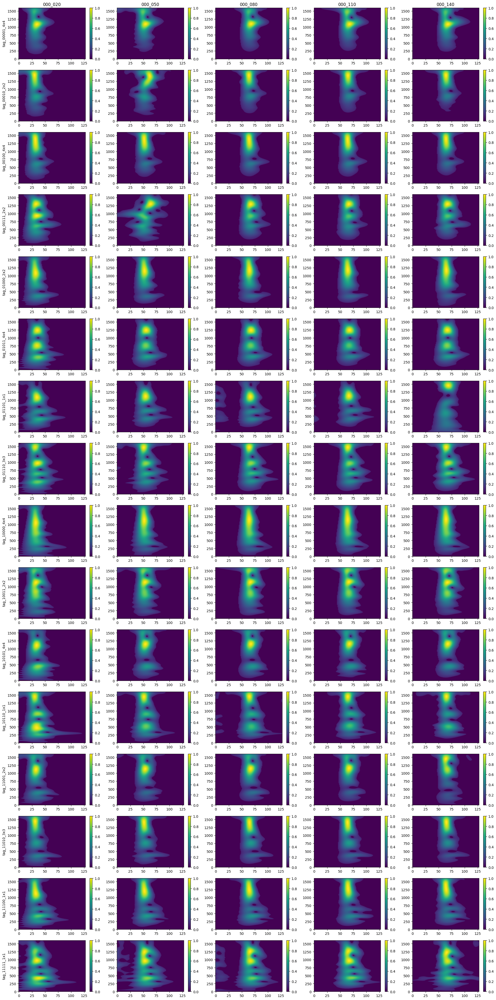

In [7]:
# Definir los intervalos y las etiquetas para el encabezado y las filas
interval_labels = np.unique(intervals_ref)
unique_labels = np.unique(labels_1601_ref)

# Crear un diccionario para almacenar los heatmaps
heatmaps = {}

# Paso 2: Promediar los valores de las imágenes hiperespectrales según las etiquetas y los intervalos
for label in unique_labels:
    heatmaps[label] = []
    for interval_label in interval_labels:
        interval_indices = (intervals_ref == interval_label)
        label_indices = (labels_1601_ref == label)
        selected_indices = np.where(interval_indices & label_indices)[0]
        if len(selected_indices) > 0:
            average_values = x_out_1601_ref[selected_indices].mean(axis=0)
            average_values_squeezed = np.squeeze(average_values)
            heatmaps[label].append(average_values_squeezed)
        else:
            heatmaps[label].append(np.zeros((1601, 128)))  # Agrega una matriz vacía si no hay coincidencias

# Paso 3: Crear una figura con subplots para visualizar los heatmaps
fig, axes = plt.subplots(nrows=len(unique_labels), ncols=len(interval_labels), figsize=(20, 40))

for i, label in enumerate(unique_labels):
    for j, interval_label in enumerate(interval_labels):
        ax = axes[i, j]
        im = ax.imshow(heatmaps[label][j], aspect='auto', origin='lower', cmap='viridis')
        if i == 0:
            ax.set_title(interval_label)
        if j == 0:
            ax.set_ylabel(label)
        fig.colorbar(im, ax=ax, orientation='vertical')

plt.tight_layout()
plt.show()


**Aplicaremos el filtro**

In [8]:
thr = 0.1
x_out_1601 = filter_cwt(x_out_1601, thr)
x_out_1601_test= filter_cwt(x_out_1601_test, thr)
x_out_1601_ref= filter_cwt(x_out_1601_ref, thr)

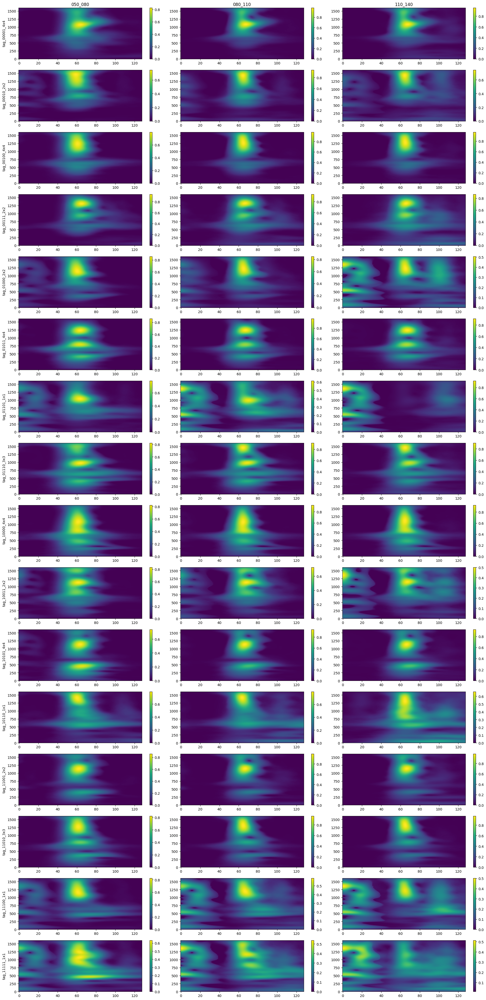

In [9]:
# Definir los intervalos y las etiquetas para el encabezado y las filas
interval_labels = ["050_080", "080_110", "110_140"]
unique_labels = np.unique(labels_1601)

# Crear un diccionario para almacenar los heatmaps
heatmaps = {}

# Paso 2: Promediar los valores de las imágenes hiperespectrales según las etiquetas y los intervalos
for label in unique_labels:
    heatmaps[label] = []
    for interval_label in interval_labels:
        interval_indices = (intervals == interval_label)
        label_indices = (labels_1601 == label)
        selected_indices = np.where(interval_indices & label_indices)[0]
        if len(selected_indices) > 0:
            average_values = x_out_1601[selected_indices].mean(axis=0)
            average_values_squeezed = np.squeeze(average_values)
            heatmaps[label].append(average_values_squeezed)
        else:
            heatmaps[label].append(np.zeros((1601, 128)))  # Agrega una matriz vacía si no hay coincidencias

# Paso 3: Crear una figura con subplots para visualizar los heatmaps
fig, axes = plt.subplots(nrows=len(unique_labels), ncols=len(interval_labels), figsize=(20, 40))

for i, label in enumerate(unique_labels):
    for j, interval_label in enumerate(interval_labels):
        ax = axes[i, j]
        im = ax.imshow(heatmaps[label][j], aspect='auto', origin='lower', cmap='viridis')
        if i == 0:
            ax.set_title(interval_label)
        if j == 0:
            ax.set_ylabel(label)
        fig.colorbar(im, ax=ax, orientation='vertical')

plt.tight_layout()
plt.show()
